In [1]:
import torch
import torchvision

train = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=None)
test = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=None)

import os
import numpy as np
import matplotlib.pyplot as plt

from coshrem.shearletsystem import EdgeSystem
from coshrem.util.image import overlay, mask, thin_mask, curvature_rgb
from coshrem.util.curvature import curvature
import coshrem.util
from PIL import Image


100.0%


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


In [5]:


# Open an image and read it in as numpy array
img = np.array(train[0][0])[..., -1]

# Create a shearlet system for edge detection using default parameters
#
# An identical system would be created by
#
# sys = EdgeSystem(*img.shape,
#                   wavelet_eff_supp=70,
#                   gaussian_eff_supp=25,
#                   scales_per_octave=2,
#                   shear_level=3,
#                   alpha=0.5,
#                   octaves=3.5
#                   )
sys = EdgeSystem(*img.shape)

# Perform edge and edge-orientation measurement
edges, orientations = sys.detect(img, min_contrast=4)

print(edges.shape, orientations.shape)

# Use a mask on the array to thin edges to single pixel width
thinned_edges = mask(edges, thin_mask(edges))
thinned_orientations = mask(edges, thin_mask(edges))

# Perform curvature measurement on the thinned orientations and convert into rgb image
rgb_curvature = curvature_rgb(curvature(thinned_orientations), max_curvature=10)

# Write images to disk
Image.fromarray(np.uint8(edges * 255), mode="L").save("edges.png")
Image.fromarray(overlay(img, edges), mode="RGB").save("overlay_edges.png")
Image.fromarray(np.uint8(thinned_edges * 255), mode="L").save("thin_edges.png")

# Create overview diagram with matplotlib
f, ((ax11, ax12, ax13, ax14), (ax21, ax22, ax23, ax24)) = plt.subplots(2, 4, sharex=True, sharey=True, subplot_kw={'adjustable':'box'})

ax11.imshow(img, cmap='gray', interpolation='none')
ax11.set_title("Original\nimage")

ax12.set_title("Edge\nmeasurement")
ax12.imshow(edges, cmap='jet', interpolation='none')

ax13.set_title("Thinned edge\nmeasurement")
ax13.imshow(thinned_edges, cmap='jet', interpolation='none')

ax14.axis('off')

ax21.set_title("Edge overlay")
ax21.imshow(overlay(img, edges), interpolation='none')

# To visualize the orientation measurement, use a cyclic colormap where 0 and 180 are similar or equal
ax22.set_title("Orientation\nmeasurement")
ax22.imshow(orientations, cmap=coshrem.util.image.cyclic_cmap(), interpolation='none')

ax23.set_title("Thinned orientation\nmeasurement")
ax23.imshow(thinned_orientations, coshrem.util.image.cyclic_cmap(), interpolation='none')

ax24.set_title("Local curvature\nmeasurement")
ax24.imshow(rgb_curvature, cmap='jet', interpolation='none')

f.set_size_inches(16, 9)
f.set_tight_layout(True)
f.set_dpi(1600)
plt.show()

(32, 32) (32, 32)


In [118]:
# -*- coding: utf-8 -*-
"""

Title: Shearlet based CNN vs. simple MLP in Fashion MNIST.
	
Created on Mon Mar 16 17:44:29 2020

@author: Héctor Andrade-Loarca & Ujjawal.K.Panchal & Manny Ko.

debugged date: Sun Sep 19 14:07:17 2021.
"""
import os, time
import numpy as np
from PIL import Image
from coshrem.shearlet import construct_shearlet
from numpy.random import randint
from numpy.fft import fft2, ifft2, fftshift, ifftshift
from skimage.transform import resize

#import numba

from coshrem.util.cone import cone_orientation
from coshrem.shearlet import yapuls, padarray, shear, construct_shearlet
from matplotlib.colors import hsv_to_rgb

import torch

from shnetutil import cplx, shxform
from shnetutil.shxform import CoShREMConfig
import cplxmodule
from shnetutil.utils import torchutils
from shnetutil.cplx import visual

# Default parameters for our Shearlet system
# https://www.math.colostate.edu/~king/software/CoShREM_Parameter_Guide.pdf
#

ksh_spec = CoShREMConfig(
			rows = 32,
			cols = 32,
			scales_per_octave = 2,
			shear_level = 3,
			octaves = 1,
			alpha = .5,	#   Anisotropy level
						#	alpha: coefficient determining level of anisotropy. 
						#	1 -> wavelets, 
						#	0.5 -> shearlets, 
						#	0 -> ridgelets... etc.

			wavelet_eff_support = 7,
			gaussian_eff_support = 14,
)

def get_sh_spec(rows:int, cols:int, alpha:float=0.5):
	""" Configure a sh_spec for our Shearlet system """
	sh_spec = ksh_spec.copy()
	sh_spec['rows'] = rows
	sh_spec['cols'] = cols
	sh_spec['alpha'] = alpha
	return sh_spec

def get_CoShXform(device:str, rows:int, cols:int, alpha:float=0.5):
	""" Start a CoShXform """
	sh_spec = get_sh_spec(rows, cols, alpha)
	coshxform = CoShXform(sh_spec)
	coshxform.start(device)
	return coshxform	

def power_of_two(target):
	""" round to next power-of-2 """
	if target > 1:
		for i in range(1, int(target)):
			if (2 ** i >= target):
				return 2 ** i
	else:
		return 1

class CoShXform(shxform.ShXform):
	def __init__(self,
		sh_spec = ksh_spec, 
		tocplx = False,
		topolar = False,
		phase_first = False
	):
		""" Generating the shearlet system with pyCoShRem """
		super().__init__(sh_spec=sh_spec)	#default complex Shearlet spec - usually provided by client
		nextp2 = power_of_two(self.dim[0])
		assert(nextp2 == self.dim[0])
		self.ourdim = (nextp2, nextp2)
		self.tocplx = tocplx
		self.topolar = topolar
		self.phase_first = phase_first
		#print(f"CoShXform: {sh_spec}")

	def __repr__(self):	
		return f"CoShXform({self.sh_spec})"	

	def __str__(self):
		return f"CoShXform({self.sh_spec})"	

	def start(self, device):
		super().start(device)

		#t = time.time()
		self._shearletSystem = getcomplexshearlets2D(**dict(self.sh_spec))
		#self.shearlets, self.shearletIdxs = self.shearletSystem
		#print(f"Elapsed time: getcomplexshearlets2D() {time.time()-t:3f}ms")

		#for pytorch deal with the imaginary and real part we separate them into two arrays
		shearlets_complex = to_torch_complex(self.shearlets)
		self.shearlets_complex = shearlets_complex
		self.torch_shearlets = torch.tensor(shearlets_complex).unsqueeze(0).to(device).float()
	
	def xform(self, entry):
		"""
		Uses Broadcasting way to compute Shearlet Xform - - Fourier Conv. Theorem
		20x faster for single batch Sh. X. form.
		200x faster for large batches for Sh. Xform.
		 entry = (Tensor, label) - i.e. CustomDataset like
		"""
		# print("<.>: Using Broadcasted version of Xform")
		image, label = entry
		# print("type:", type(image), "shape:", image.shape, "ele type:", type(image.flatten()[0]))
		torch_shearlets = self.torch_shearlets
		# print("type shearlets:", type(torch_shearlets), "shape:", torch_shearlets.shape, "ele type:", torch_shearlets.flatten()[0].type())
		#for pytorch we separate imaginary and real part into two arrays 
		
		image_complex = to_torch_complex4Img(image)
		# print("image_complex:", type(image_complex), "shape:", image_complex.shape, "ele type:", type(image_complex.flatten()[0]))

		torch_image = torch.FloatTensor(image_complex).unsqueeze(0).to(self.device)
		# print("torch_image:", type(torch_image), "shape:", torch_image.shape, "ele type:", torch_image.flatten()[0].type())
		# t = time.time()
		torch_coeffs = torchsheardec2D_broadcast(torch_image, torch_shearlets)
		# print("torch_coeffs type:", type(torch_coeffs), "shape:", torch_coeffs.shape, "ele type:", torch_coeffs.flatten()[0].type())
		# print("\n\n\n")
		if (self.tocplx) and torch_coeffs.dtype not in [torch.complex32, torch.complex64, torch.complex128]:
			assert (torch_coeffs.shape[-1] == 2) #the last dim holds real and complex.
			torch_coeffs = cplxmodule.cplx.Cplx(torch_coeffs[...,0], torch_coeffs[...,1])
		
		if (self.topolar):
			mag, phase = cplx.utils.complex2magphase(torch_coeffs) #TODO: not use general functions.
			if (self.phase_first):
				torch_coeffs = torch.stack((phase, mag), dim = -1)
			else:
				torch_coeffs = torch.stack((mag, phase), dim = -1)
		return torch_coeffs

	def batch_xform(self, batch):
		"""
		Transform a whole batch (stacked vertically(axis = 0)) of images as ndarray(batchsize, w, h).
		"""
		batch_complex = to_torch_complex(batch) #it is 3 dimensional. So we can use to_torch_complex.
		torch_batch = torch.FloatTensor(batch_complex).to(self.device)
		batch_coeffs = torchsheardec2D_broadcast(torch_batch, self.torch_shearlets)
		if (self.tocplx):
			#assert (batch_coeffs.shape[4] == 2) #the 5th dim holds real and complex.
			batch_coeffs = cplxmodule.cplx.Cplx(batch_coeffs.real, batch_coeffs.imag)
			
		if (self.topolar):
			mag, phase = batch_coeffs.abs(), batch_coeffs.angle() #TODO: Not use General functions.
			if (self.phase_first):
				batch_coeffs = torch.stack((phase, mag), dim = 4)
			else:
				batch_coeffs = torch.stack((mag, phase), dim = 4)
		return batch_coeffs

	def xform2(self, image):
		""" image = ndarray """
		#NOTE: *** this is only here for running the unit test in here - not for real use
		torch_shearlets = self.torch_shearlets

		#for pytorch we separate imaginary and real part into two arrays 
		image_complex = to_torch_complex4Img(image)
		torch_image = torch.FloatTensor(image_complex[np.newaxis, :,:,:]).to(self.device)

		#t = time.time()
		torch_coeffs = torchsheardec2D(torch_image, torch_shearlets)
		#print(f"Elapsed time torchsheardec2D(): {time.time()-t:3f}ms")		
		return torch_coeffs

# ## Relevant CoShReM function

# Single shearlet computation
def _single_shearlet(
	rows, cols, 
	wavelet_eff_supp,
	gaussian_eff_supp, scales_per_octave,
	shear_level, alpha, 
	sample_wavelet_off_origin,
	scale, ori, _coneh, _ks, hilbert_matrix
):
	shearlet_f = construct_shearlet(rows, cols, wavelet_eff_supp,
								  gaussian_eff_supp, scales_per_octave,
								  shear_level, alpha,
								  sample_wavelet_off_origin, scale, ori, _coneh, _ks)

	if ori in _coneh:
		shearlet_f = shearlet_f + (hilbert_matrix[:, :, 0] * shearlet_f)
		# shearlet_f = np.fliplr(np.flipud(_hilbert_f(shearlet_f * -1)))
		# if not self.sampleWaveletOffOrigin:
		#     shearlet_f = np.roll(shearlet_f, -1, axis=0)
	else:
		if ori > np.max(_coneh):
			shearlet_f = -1 * (shearlet_f + hilbert_matrix[:, :, 1] * shearlet_f)
			# shearlet_f = _hilbert_f(shearlet_f.T * -1).T
			# shearlet_f = np.roll(shearlet_f, 1, axis=1)
		else:
			shearlet_f = shearlet_f + hilbert_matrix[:, :, 1] * shearlet_f
			# shearlet_f = _hilbert_f(shearlet_f.T).T
	return shearlet_f

def getcomplexshearlets2D(
	rows, 
	cols, 
	scales_per_octave, 
	shear_level, 
	octaves, alpha,
	wavelet_eff_support = 7,
	gaussian_eff_support = None,
):

	# Parameters precomputing
	gaussian_eff_support = gaussian_eff_support if gaussian_eff_support else wavelet_eff_support * 2 
	wavelet_eff_supp = np.min((rows, cols)) / wavelet_eff_support
	gaussian_eff_supp = np.min((rows, cols)) / gaussian_eff_support
	sampleWaveletOffOrigin= True

	hilbert_matrix = np.ones((rows, cols, 2))
	hilbert_matrix[:(rows//2), :, 0] = -1
	hilbert_matrix[:, (cols//2):, 1] = -1
	n_oris = 2 ** shear_level + 2
	scales = np.arange(1, (scales_per_octave * octaves) + 1)
	n_shearlets = len(scales) * n_oris

	normalize=True
	_, _coneh, _ks =  cone_orientation(shear_level)
	shearlets = np.zeros((rows, cols,n_shearlets), dtype=np.complex_)
	shearletidx = []
	# Computing shearlets
	for j, scale in enumerate(scales):
		for ori in range(n_oris):
			shearlet = _single_shearlet(rows, cols, wavelet_eff_supp,
						   gaussian_eff_supp, scales_per_octave,
						   shear_level, alpha, sampleWaveletOffOrigin,
						   scale, ori+1, _coneh, _ks, hilbert_matrix)

			if ori in _coneh:
				shearletidx.append([1,int(scale), _ks[ori]])
			else:
				shearletidx.append([2,int(scale), _ks[ori]])
			shearlets[:, :, n_oris * j + ori] = shearlet
	# Computing RMS (Root mean square)
	RMS = np.linalg.norm(shearlets[0], axis=(0, 1))/np.sqrt(rows*cols)
	dualFrameWeights = np.sum(np.power(np.abs(shearlets), 2), axis=2)
	return shearlets, shearletidx, RMS, dualFrameWeights


def sheardec2D(X, shearlets):
	"""Shearlet Decomposition function."""
	# ## Classical way to compute the coefficients

	# Classically one compute the coefficients by using the convolution
	# 
	# $$
	# \text{SH}(f)_{j,k,m}^{2D} (f) = \overline{\psi^{d}_{j,k,m}}\ast f = \widehat{\psi^{d}_{j,k,m}}\cdot \widehat{f}
	# $$
	# 
	# where the last equality is obtained by using the Fourier convolutional theorem. Since Fourier is fast to compute the second identity is better to use.

	coeffs = np.zeros(shearlets.shape, dtype=complex)
	Xfreq = fftshift(fft2(ifftshift(X)))
	for i in range(shearlets.shape[2]):
		coeffs[:, :, i] = fftshift(ifft2(ifftshift(Xfreq * np.conj(
								   shearlets[:, :, i]))))
	return coeffs

def shearrec2D(coeffs, shearlets, dualFrameWeights):
	"""Shearlet Reconstruction function."""
	Xfreq = np.zeros((coeffs.shape[0], coeffs.shape[1]), dtype=complex)
	for i in range(coeffs.shape[2]):
		Xfreq += fftshift(fft2(ifftshift(coeffs[..., i])))* np.conj(shearlets[..., i])
	InversedualFrameWeights = 1 / dualFrameWeights
	InversedualFrameWeights[InversedualFrameWeights==np.inf] = 0.0
	return fftshift(ifft2(ifftshift(InversedualFrameWeights*Xfreq)))


# ## Compute the coefficients purely in pytorch

# Besides of being a deep learning framework, pytorch also serves as a platform to do differentiable programming, 
# which is at the same time scalable and multiplatform, allowing us to do computations in the gpu with no need to write a kernel.
# 
# FFT is implemented in pytorch, just not fftshift and ifftshift which deal with centering the zero frequencies

# Since we need to use ifftshift and fftshift, we can easily implement it in torch using the roll function for circ shift
def roll_n(X, axis, n):
	f_idx = tuple(slice(None, None, None) if i != axis else slice(0, n, None) for i in range(X.dim()))
	b_idx = tuple(slice(None, None, None) if i != axis else slice(n, None, None) for i in range(X.dim()))
	front = X[f_idx]
	back = X[b_idx]
	return torch.cat([back, front], axis)

def batch_fftshift2d(x):
	""" shift with circular wrap (toroidal) """
	real, imag = torch.unbind(x, -1)
	for dim in range(1, len(real.size())):
		n_shift = real.size(dim)//2
		if real.size(dim) % 2 != 0:
			n_shift += 1  # for odd-sized images
		real = roll_n(real, axis=dim, n=n_shift)
		imag = roll_n(imag, axis=dim, n=n_shift)
	return torch.stack((real, imag), -1)  # last dim=2 (real&imag)

def batch_fftshift2d_broad(x):
	real, imag = torch.unbind(x, -1)
	for dim in range(1, len(real.size())-1):
		n_shift = real.size(dim)//2
		if real.size(dim) % 2 != 0:
			n_shift += 1  # for odd-sized images
		real = roll_n(real, axis=dim, n=n_shift)
		imag = roll_n(imag, axis=dim, n=n_shift)
	return torch.stack((real, imag), -1)  # last dim=2 (real&imag)

def batch_ifftshift2d(x):
	real, imag = x.real, x.imag
	for dim in range(len(real.size()) - 1, 0, -1):
		real = roll_n(real, axis=dim, n=real.size(dim)//2)
		imag = roll_n(imag, axis=dim, n=imag.size(dim)//2)
	return torch.complex(real, imag)  # last dim=2 (real&imag

def batch_ifftshift2d_broad(x):
	if x.dtype == torch.complex64:
		real, imag = x.real, x.imag
	else:
		real, imag = torch.unbind(x, -1)
	for dim in range(len(real.size()) - 2, 0, -1):
		real = roll_n(real, axis=dim, n=real.size(dim)//2)
		imag = roll_n(imag, axis=dim, n=imag.size(dim)//2)

	return torch.complex(real, imag)  # last dim=2 (real&imag

def to_torch_complex(shearlets):
	"""for pytorch to deal with the imaginary and real part we separate them into two arrays """
	#print(f"to_torch_complex {shearlets.shape}")
	shearlets_complex = np.concatenate((
		shearlets.real[:,:,:,np.newaxis], 
		shearlets.imag[:,:,:,np.newaxis]), 
		3
	)
	return shearlets_complex

def to_torch_complex4Img(image):
	"""for pytorch to deal with the imaginary and real part we separate them into two arrays """
	#print(f" to_torch_complex4Img {image.shape}")
	image_complex = np.concatenate(
		(image[:,:,np.newaxis], np.zeros(image.shape)[:,:,np.newaxis]), 
		2
	)
	return image_complex

def dot_complex(x, y):
	x = x.type(torch.complex64)
	y = y.type(torch.complex64)
	xreal, ximag = x.real, x.imag
	yreal, yimag = y.real, y.imag
	
	xyreal =  xreal*yreal + ximag*yimag
	xyimag = -xreal*yimag + ximag*yreal
	return torch.complex(xyreal, xyimag)

def torchsheardec2D(torch_X,  torch_shearlets):
	"""Shearlet Decomposition function."""
	#print(f" torchsheardec2D {torch_X.shape}")
	coeffs = torch.zeros((torch_X.shape[0], torch_X.shape[1], torch_X.shape[2],
					 torch_shearlets.shape[3], torch_X.shape[3]))
	Xfreq = batch_ifftshift2d(torch.fft.fftn(batch_fftshift2d(torch_X), 2))
	for i in range(torch_shearlets.shape[3]):
		coeffs[:, :, :, i, :] = batch_ifftshift2d(torch.fft.ifftn(batch_fftshift2d(
			dot_complex(Xfreq, torch_shearlets[:,:,:,i,:])), 2))
	return coeffs


# port a signature like torch.fft() (from old pytorch) but computes using torch.fft.fft() (new pytorch).
def dispatch_my_fourier_args(signal_ndim, normalized = False):
	"""
	To port between torch's old fft function (torch 1.6) to new fft.fftn() function.
	"""
	if signal_ndim < 1 or signal_ndim > 3:
		print("Signal ndim out of range, was", signal_ndim, "but expected a value between 1 and 3, inclusive")
	
	dims = (-1)
	if signal_ndim == 2:
		dims = (-2, -1)
	if signal_ndim == 3:
		dims = (-3, -2, -1)
	
	norm = "backward"
	if normalized:
		norm = "ortho"
	return dims, norm

def my_fft(input, signal_ndim, normalized = False):
	dims, norm = dispatch_my_fourier_args(signal_ndim, normalized)
	return torch.fft.fftn(torch.view_as_complex(input), dim = dims, norm = norm)

def my_ifft(input, signal_ndim, normalized = False):
	dims, norm = dispatch_my_fourier_args(signal_ndim, normalized)
	return torch.fft.ifftn(input, dim = dims, norm = norm)


def torchsheardec2D_broadcast(torch_X,  torch_shearlets):
	"""Shearlet Decomposition function."""
	Xfreq = batch_ifftshift2d(my_fft(batch_fftshift2d(torch_X), 2))
	coeffs = batch_ifftshift2d_broad(
				my_ifft(
					batch_ifftshift2d_broad(
						dot_complex(Xfreq[:,:,:,np.newaxis],
						torch.view_as_complex(torch_shearlets))
					).permute(0,3,1,2),
					2
				).permute(0,2,3,1)
			)
	return coeffs


<class 'numpy.ndarray'>


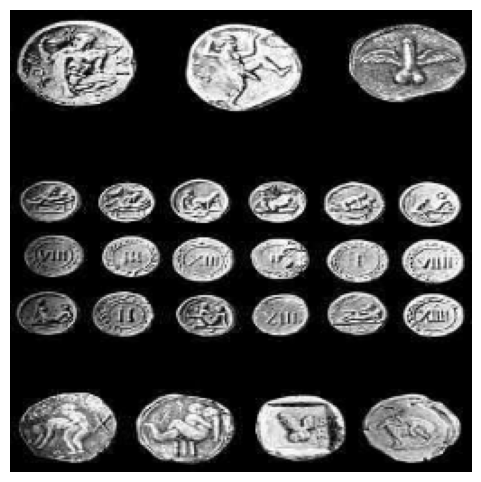

sh_spec: rows=256 cols=256 scales_per_octave=2 shear_level=3 octaves=2 alpha=0.5 wavelet_eff_support=14 gaussian_eff_support=7
torchutils.onceInit device = cuda:0
initSeeds(1)
shearlets.shape (256, 256, 40)


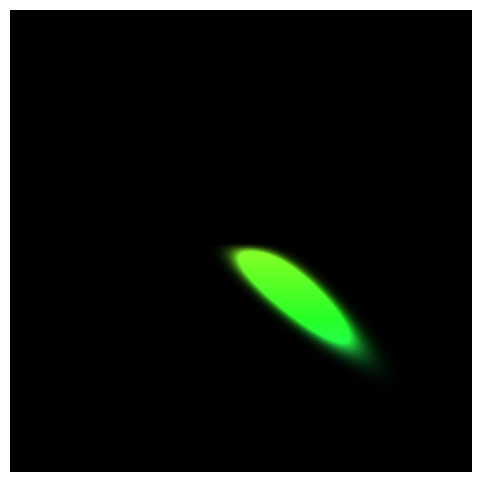

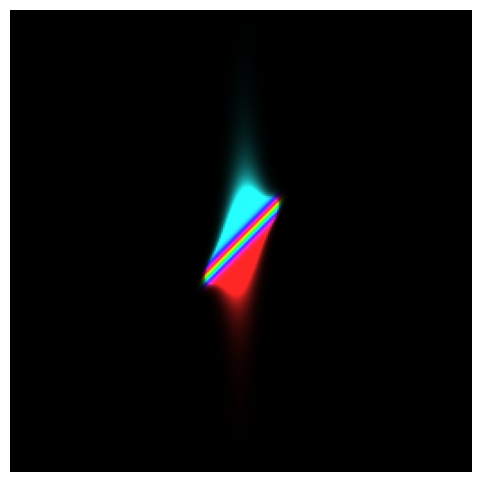

CLASSICAL -----------------------------
Elapsed time: sheardec2D() 0.069911ms
WITH CUDA -----------------------------
Elapsed time torchsheardec2D(): 0.021862ms
<.>: Using Broadcasted version of Xform
type: <class 'numpy.ndarray'> shape: (256, 256) ele type: <class 'numpy.float64'>
type shearlets: <class 'torch.Tensor'> shape: torch.Size([1, 256, 256, 40, 2]) ele type: torch.cuda.FloatTensor
image_complex: <class 'numpy.ndarray'> shape: (256, 256, 2) ele type: <class 'numpy.float64'>
torch_image: <class 'torch.Tensor'> shape: torch.Size([1, 256, 256, 2]) ele type: torch.cuda.FloatTensor
torch_coeffs type: <class 'torch.Tensor'> shape: torch.Size([1, 256, 256, 40]) ele type: torch.cuda.ComplexFloatTensor




BATCHED -----------------------------
batch type: <class 'numpy.ndarray'>
my batch img shape: (64, 256, 256)
Batch Xform took : 0.04861903190612793 s for a batch of size 64
Elapsed time sheardec2D(): 0.062095ms
batch img complex shape: (256, 256, 2)
batch image shape: (20, 256, 256,

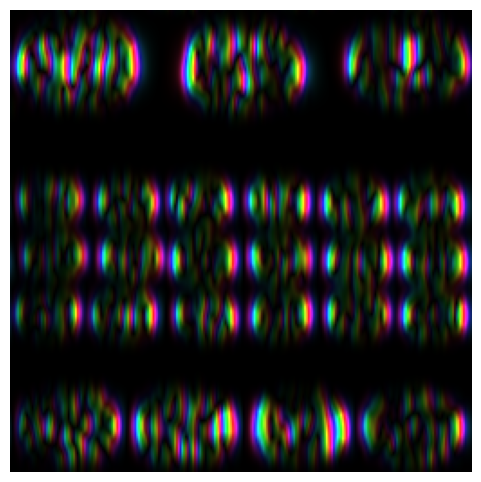

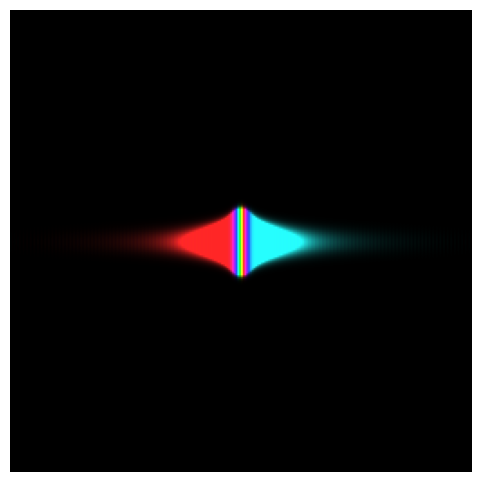

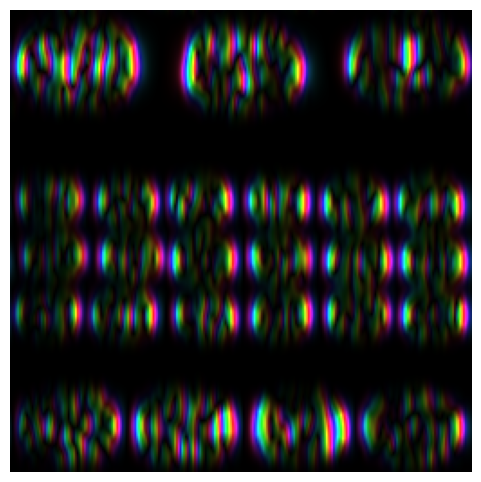

COMPLEX -----------------------------
<.>: Using Broadcasted version of Xform
type: <class 'numpy.ndarray'> shape: (256, 256) ele type: <class 'numpy.float64'>
type shearlets: <class 'torch.Tensor'> shape: torch.Size([1, 256, 256, 40, 2]) ele type: torch.cuda.FloatTensor
image_complex: <class 'numpy.ndarray'> shape: (256, 256, 2) ele type: <class 'numpy.float64'>
torch_image: <class 'torch.Tensor'> shape: torch.Size([1, 256, 256, 2]) ele type: torch.cuda.FloatTensor
torch_coeffs type: <class 'torch.Tensor'> shape: torch.Size([1, 256, 256, 40]) ele type: torch.cuda.ComplexFloatTensor




cplex batchxform took : 0.016414642333984375 seconds.


In [52]:

import matplotlib.pyplot as plt
from skimage import data
from skimage.transform import resize

size = 256
img = np.array(Image.open("coins.png").convert('L'))
print(type(img))
image = resize(img, (size,size))

plt.figure(figsize = (6,6))
plt.axis("off")
plt.imshow(image, cmap = "gray")
plt.show()

# Relevant parameters for our Shearlet system
rows, cols = image.shape
sh_spec = CoShREMConfig(rows = rows,
                        cols = cols,
                        scales_per_octave = 2,
                        shear_level = 3,
                        octaves = 2,
                        alpha = .5,
                        wavelet_eff_support = 14,
                        gaussian_eff_support = 7)

print(f"sh_spec: {sh_spec}")

# Generating the shearlet system with pyCoShRem
device = torchutils.onceInit(kCUDA=True)
coshxform = CoShXform(sh_spec)
coshxform.start(device)

shearlets, shearletIdxs, RMS, dualFrameWeights = coshxform.shearletSystem

# The shearlets have 56 slices
print(f"shearlets.shape {shearlets.shape}")

j = 3
shearlet = shearlets[:,:,j]

qUpper = np.percentile(np.absolute(shearlet), 98)
visual.complexImageShow(shearlet/qUpper)
plt.show()

# ### Visualizing the shearlets in spatial domain
shearlet_space = fftshift(ifft2(ifftshift(shearlet)))

qUpper = np.percentile(np.absolute(shearlet_space), 98)
visual.complexImageShow(shearlet_space/qUpper)
plt.show()

print('CLASSICAL -----------------------------')
#3: Classical way to compute the coefficients
t = time.time()
coeffs = sheardec2D(image, shearlets)
print(f"Elapsed time: sheardec2D() {time.time()-t:3f}ms")

#3.1: The coefficients are
j = 10
coeff = coeffs[:,:,j]
shearlet_space = fftshift(ifft2(ifftshift(shearlets[:,:,j])))

qUpper = np.percentile(np.absolute(coeff), 98)
visual.complexImageShow(coeff/qUpper)

#3.2: Coming from the filter
qUpper = np.percentile(np.absolute(shearlet_space), 98)
visual.complexImageShow(shearlet_space/qUpper)
#plt.show()

#4: use pytorch 
# In order to make pytorch deal with the imaginary and real part we need to separate them in two different arrays
shearlets_complex = coshxform.shearlets_complex
torch_shearlets	  = coshxform.torch_shearlets
device = coshxform.device

# CUDA for PyTorch
print('WITH CUDA -----------------------------')
use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0")
torch.backends.cudnn.enabled = True

torch_shearlets = torch.tensor(shearlets_complex[np.newaxis, :,:,:,:]).to(device)

# We need to do the same for the image
image_complex = np.concatenate((image[:,:,np.newaxis], np.zeros(image.shape)[:,:,np.newaxis]), 2)
torch_image = torch.tensor(image_complex[np.newaxis, :,:,:]).to(device)

t = time.time()
torch_coeffs = torchsheardec2D(torch_image, torch_shearlets)
print(f"Elapsed time torchsheardec2D(): {time.time()-t:3f}ms")

torch_coeffs = coshxform.xform((image, None))
#	torch_coeffs = coshxform.xform2(image)

#Batch xform trials.
print('BATCHED -----------------------------')
batch_size = 64
t1_batch = time.time()
batch = np.repeat(image[np.newaxis,:,:], batch_size, axis = 0)
print(f"batch type: {type(batch)}")
print(f"my batch img shape: {batch.shape}")
batch_torch_coeffs = coshxform.batch_xform(batch)
print(f"Batch Xform took : {time.time() - t1_batch} s for a batch of size {batch_size}")

# Comparison with the other for one batch
t = time.time()
coeffs = sheardec2D(image, shearlets)
print(f"Elapsed time sheardec2D(): {time.time()-t:3f}ms")

# ### Visualizing the coefficients produced by torch
coeffs_numpy = torch_coeffs.detach().cpu().numpy()


j = 10
coeff = coeffs_numpy[..., j]
qUpper = np.percentile(np.absolute(coeff), 98)
visual.complexImageShow(coeff/qUpper)

# Comparison with the one computed classically
j = 10
coeff = coeffs[..., j]
qUpper = np.percentile(np.absolute(coeff), 98)
visual.complexImageShow(coeff/qUpper)	

# ## Larger Batch to show advantage of using the pytorch only method
image_complex = np.concatenate((image[:,:,np.newaxis], np.zeros(image.shape)[:,:,np.newaxis]), 2)
print(f"batch img complex shape: {image_complex.shape}")
# Image batch done with repeating the same image 20 times
batch_image = np.repeat(image_complex[np.newaxis,:,:,:], 20, axis=0)
print(f"batch image shape: {batch_image.shape}")
torch_image = torch.tensor(batch_image).to(device)

t = time.time()
torch_coeffs = torchsheardec2D(torch_image, torch_shearlets)
print(f"Elapsed time: torchsheardec2D() larger batch {time.time()-t:3f}ms")

#  Comparison with doing the same thing outside pytorch
t = time.time()
for j in range(20):
    coeffs = sheardec2D(image, shearlets)
print(f"Elapsed time: sheardec2D() larger batch {time.time()-t:3f}ms")

plt.show(block=True)
#Complex Cplx testing.
print('COMPLEX -----------------------------')
coshxform = CoShXform(sh_spec, tocplx = True)
coshxform.start(device)
torch_coeffs = coshxform.xform((image, None))
t1 = time.time()
batch_coeffs = coshxform.batch_xform(batch)
print(f"cplex batchxform took : {time.time() - t1} seconds.")

<class 'numpy.ndarray'>


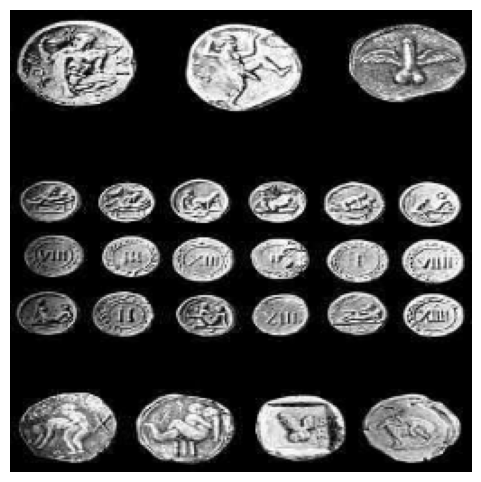

sh_spec: rows=256 cols=256 scales_per_octave=2 shear_level=2 octaves=1 alpha=0.5 wavelet_eff_support=24 gaussian_eff_support=4
torchutils.onceInit device = cuda:0
initSeeds(1)
shearlets.shape (256, 256, 12)


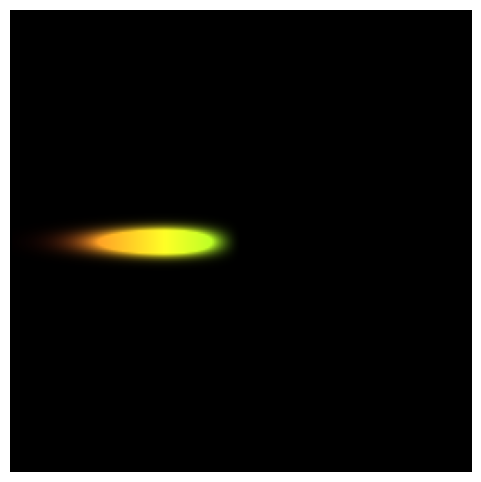

[2, 1, 0] (256, 256)


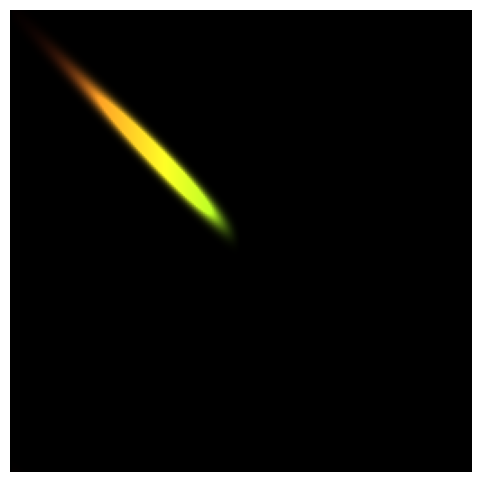

[2, 1, 1] (256, 256)


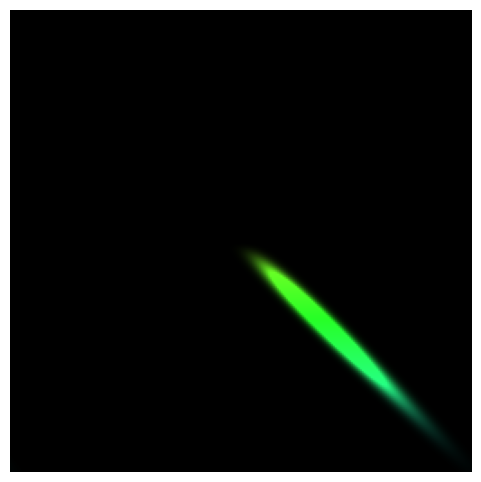

[2, 1, 1] (256, 256)


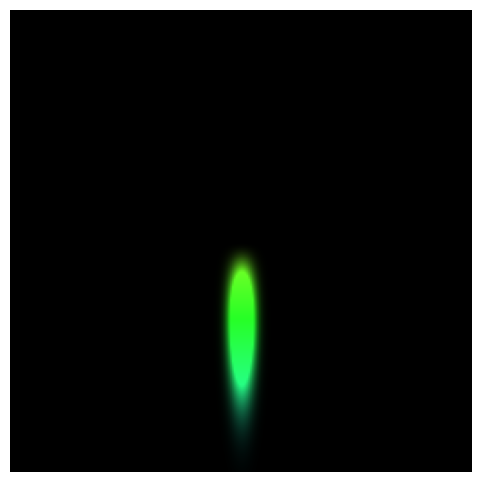

[1, 1, 0] (256, 256)


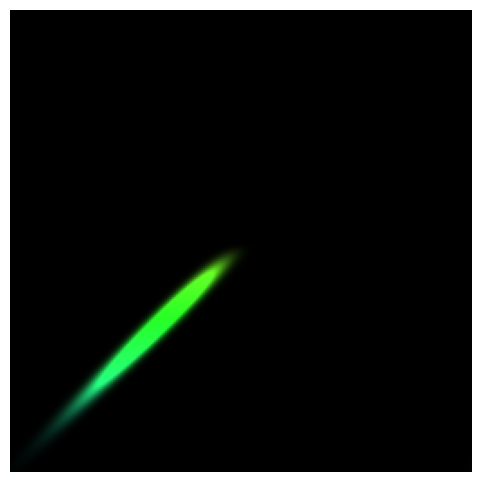

[1, 1, -1] (256, 256)


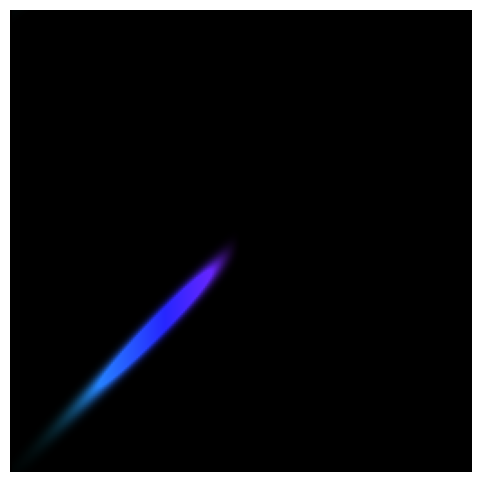

[1, 1, -1] (256, 256)


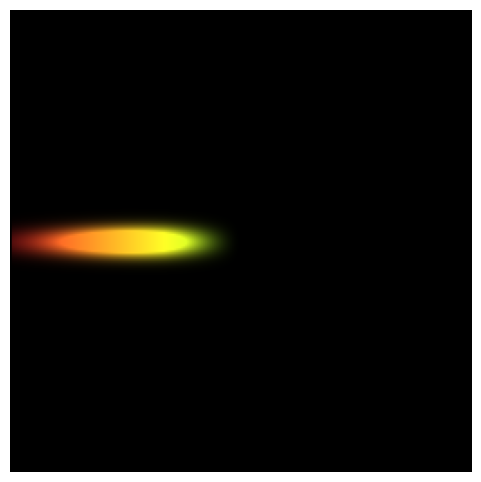

[2, 2, 0] (256, 256)


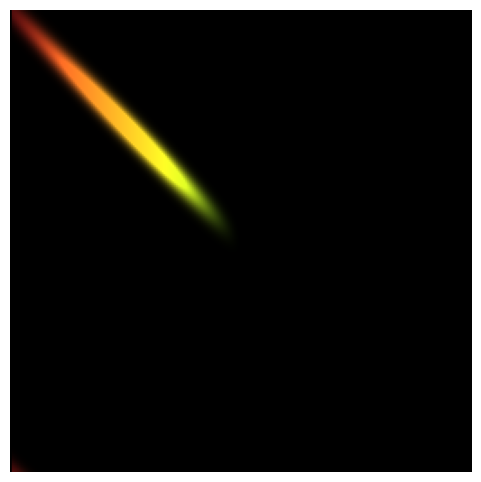

[2, 2, 1] (256, 256)


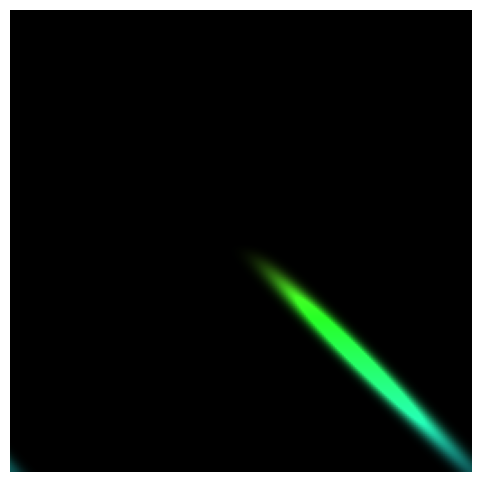

[2, 2, 1] (256, 256)


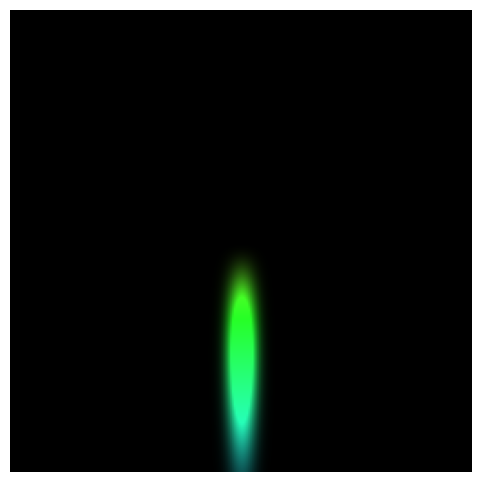

[1, 2, 0] (256, 256)


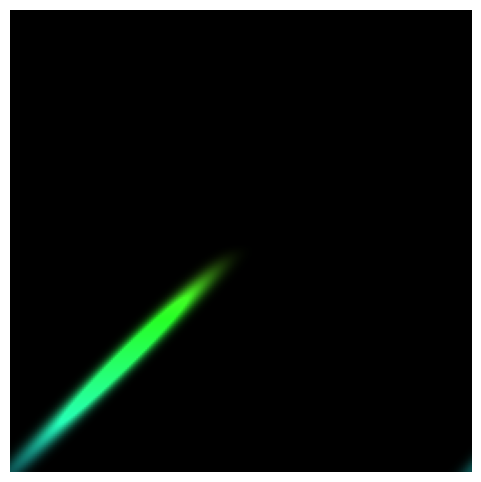

[1, 2, -1] (256, 256)


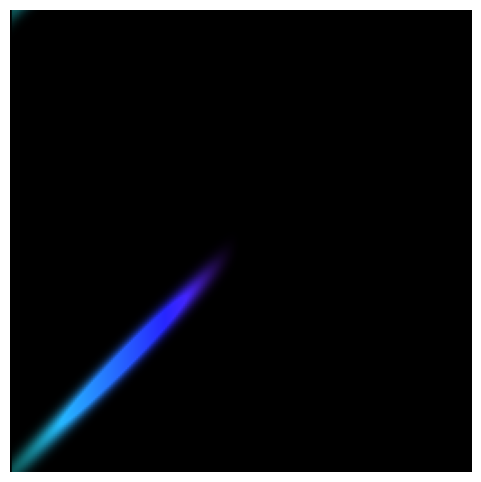

[1, 2, -1] (256, 256)


In [75]:
# now we will construct a minimal torch cuda example
# Q: How to compute the number of channels or filters?
#  (2^{shear_level} + 2)*scales_per_octave*octaves
#  The scales are handled by a fast convolution.
# Q: Where are the shearlets generated for torch?
#  self.shearlets is an @property function defined byt the shxform.ShXform superclass
# Q: Can we pick a different shearlet than the mexican hat?
#  yes we can.  The shearlets used here are defined in coshrem.shearlet.construct_shearlet, but it is a theory burden to develop a new one.
# Q: What do each of the different generated channels look like?
#  below -
# Q: How do we do RGB?
#  This is not supported by the original implementation.

import matplotlib.pyplot as plt
from skimage import data
from skimage.transform import resize

size = 256
img = np.array(Image.open("coins.png").convert('L'))
print(type(img))
image = resize(img, (size,size))

plt.figure(figsize = (6,6))
plt.axis("off")
plt.imshow(image, cmap = "gray")
plt.show()

# Relevant parameters for our Shearlet system
rows, cols = image.shape
sh_spec = CoShREMConfig(rows = rows,
                        cols = cols,
                        scales_per_octave = 2,
                        shear_level = 2,
                        octaves = 1,
                        alpha = .5,
                        wavelet_eff_support = 24,
                        gaussian_eff_support = 4)

print(f"sh_spec: {sh_spec}")

# Generating the shearlet system with pyCoShRem
device = torchutils.onceInit(kCUDA=True)
coshxform = CoShXform(sh_spec)
coshxform.start(device)

shearlets, shearletIdxs, RMS, dualFrameWeights = coshxform.shearletSystem

# The shearlets have 56 slices
print(f"shearlets.shape {shearlets.shape}")

for j in range(shearlets.shape[-1]):
    shearlet = shearlets[:,:,j]

    qUpper = np.percentile(np.absolute(shearlet), 99)
    visual.complexImageShow(shearlet/qUpper)
    plt.show()
    display()
    print(shearletIdxs[j], shearlet.shape)

    # ### Visualizing the shearlets in spatial domain
    shearlet_space = fftshift(ifft2(ifftshift(shearlet)))

In [73]:
[s.shape for s in coshxform.torch_shearlets]

[torch.Size([256, 256, 6, 2])]

In [95]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0")
torch.backends.cudnn.enabled = True

torch_shearlets = torch.tensor(shearlets_complex[np.newaxis, :,:,:,:]).to(device)

# We need to do the same for the image
image_complex = np.concatenate((image[:,:,np.newaxis], np.zeros(image.shape)[:,:,np.newaxis]), 2)
torch_image = torch.tensor(image_complex[np.newaxis, :,:,:]).to(device)

t = time.time()
torch_coeffs = torchsheardec2D(torch_image, torch_shearlets)
print(f"Elapsed time torchsheardec2D(): {time.time()-t:3f}ms")

torch_coeffs = coshxform.xform((image, None))

Elapsed time torchsheardec2D(): 0.021166ms


In [96]:
torch_coeffs.shape, torch_coeffs.dtype

(torch.Size([1, 256, 256, 12]), torch.complex64)

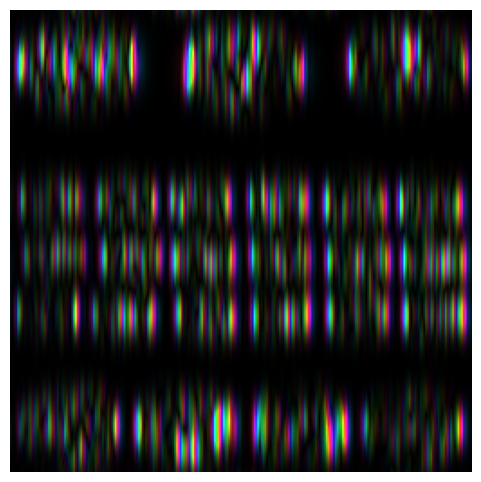

In [101]:
coeffs = torch_coeffs.cpu().squeeze()[..., 6]
qUpper = np.percentile(np.absolute(coeffs), 99)
visual.complexImageShow(coeffs/qUpper)

<class 'numpy.ndarray'>


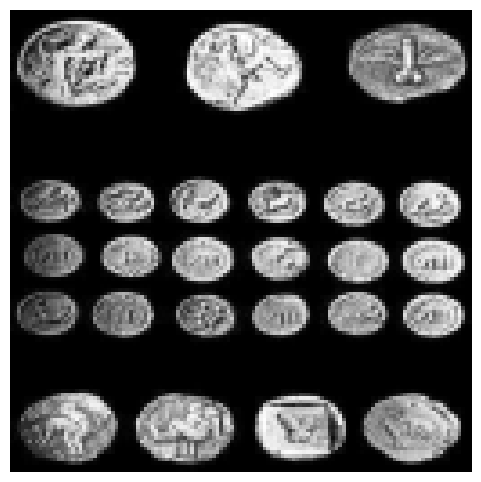

sh_spec: rows=128 cols=128 scales_per_octave=1 shear_level=2 octaves=1 alpha=0.5 wavelet_eff_support=12 gaussian_eff_support=4
torchutils.onceInit device = cuda:0
initSeeds(1)
Elapsed time torchsheardec2D(): 0.003660ms


In [104]:
size = 128
img = np.array(Image.open("coins.png").convert('L'))
print(type(img))
image = resize(img, (size,size))

plt.figure(figsize = (6,6))
plt.axis("off")
plt.imshow(image, cmap = "gray")
plt.show()

# Relevant parameters for our Shearlet system
rows, cols = image.shape
sh_spec = CoShREMConfig(rows = rows,
                        cols = cols,
                        scales_per_octave = 1,
                        shear_level = 2,
                        octaves = 1,
                        alpha = .5,
                        wavelet_eff_support = 12,
                        gaussian_eff_support = 4)

print(f"sh_spec: {sh_spec}")

# Generating the shearlet system with pyCoShRem
device = torchutils.onceInit(kCUDA=True)
coshxform = CoShXform(sh_spec)
coshxform.start(device)

shearlets, shearletIdxs, RMS, dualFrameWeights = coshxform.shearletSystem

use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0")
torch.backends.cudnn.enabled = True

# We need to do the same for the image
image_complex = np.concatenate((image[:,:,np.newaxis], np.zeros(image.shape)[:,:,np.newaxis]), 2)
torch_image = torch.tensor(image_complex).unsqueeze(0).to(device)

t = time.time()
torch_coeffs = torchsheardec2D(torch_image, coshxform.torch_shearlets)
print(f"Elapsed time torchsheardec2D(): {time.time()-t:3f}ms")

torch_coeffs = coshxform.xform((image, None))

coeffs = torch_coeffs.cpu().squeeze()[..., 3]
qUpper = np.percentile(np.absolute(coeffs), 99)
visual.complexImageShow(coeffs/qUpper)

<class 'numpy.ndarray'>


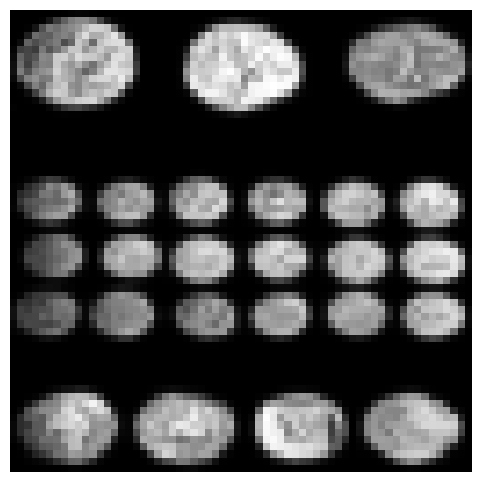

sh_spec: rows=64 cols=64 scales_per_octave=1 shear_level=2 octaves=1 alpha=0.5 wavelet_eff_support=12 gaussian_eff_support=4
torchutils.onceInit device = cuda:0
initSeeds(1)
Elapsed time torchsheardec2D(): 0.002584ms


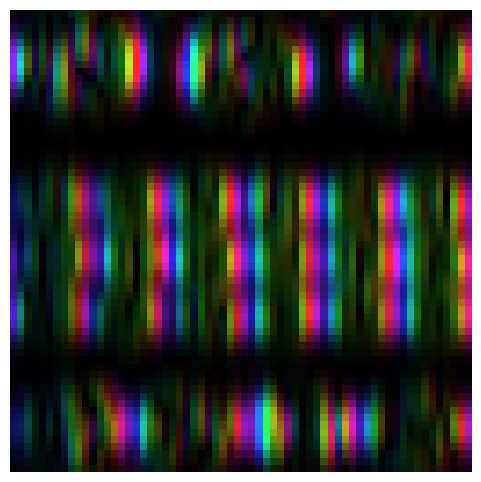

In [112]:
size = 64
img = np.array(Image.open("coins.png").convert('L'))
print(type(img))
image = resize(img, (size,size))

plt.figure(figsize = (6,6))
plt.axis("off")
plt.imshow(image, cmap = "gray")
plt.show()

# Relevant parameters for our Shearlet system
rows, cols = image.shape
sh_spec = CoShREMConfig(rows = rows,
                        cols = cols,
                        scales_per_octave = 1,
                        shear_level = 2,
                        octaves = 1,
                        alpha = .5,
                        wavelet_eff_support = 12,
                        gaussian_eff_support = 4)

print(f"sh_spec: {sh_spec}")

# Generating the shearlet system with pyCoShRem
device = torchutils.onceInit(kCUDA=True)
coshxform = CoShXform(sh_spec)
coshxform.start(device)

shearlets, shearletIdxs, RMS, dualFrameWeights = coshxform.shearletSystem

use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0")
torch.backends.cudnn.enabled = True

# We need to do the same for the image
image_complex = np.concatenate((image[:,:,np.newaxis], np.zeros(image.shape)[:,:,np.newaxis]), 2)
torch_image = torch.tensor(image_complex).unsqueeze(0).to(device)

t = time.time()
torch_coeffs = torchsheardec2D(torch_image, coshxform.torch_shearlets)
print(f"Elapsed time torchsheardec2D(): {time.time()-t:3f}ms")

torch_coeffs = coshxform.xform((image, None))

coeffs = torch_coeffs.cpu().squeeze()[..., 0]
qUpper = np.percentile(np.absolute(coeffs), 99)
visual.complexImageShow(coeffs/qUpper)

<class 'numpy.ndarray'>


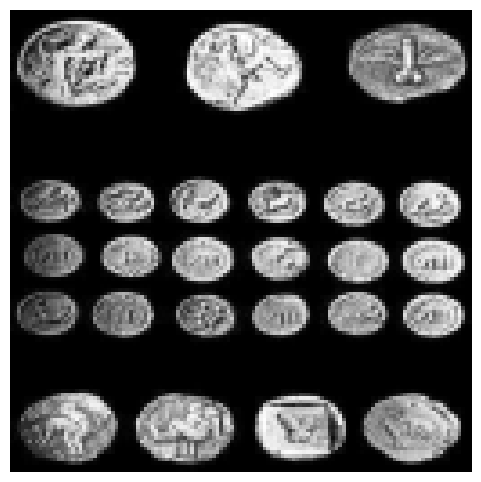

sh_spec: rows=128 cols=128 scales_per_octave=2 shear_level=3 octaves=4 alpha=0.5 wavelet_eff_support=12 gaussian_eff_support=4
torchutils.onceInit device = cuda:0
initSeeds(1)
Elapsed time torchsheardec2D(): 0.025867ms
Elapsed time torchsheardec2D_broadcast(): 0.056185ms
torch.Size([128, 128, 80])


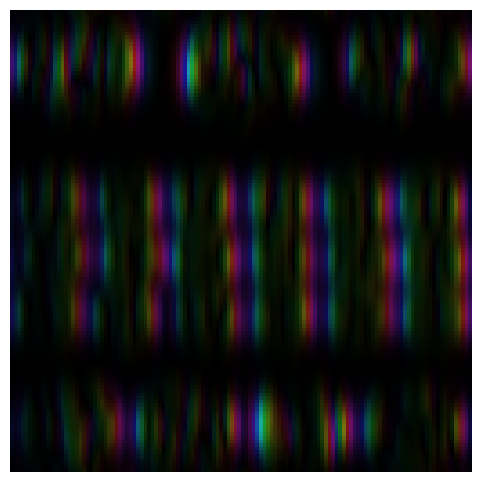

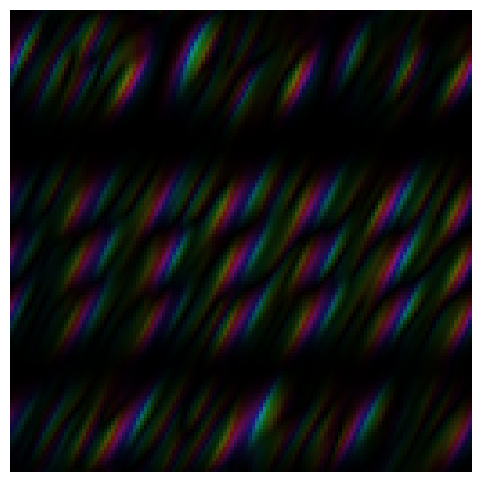

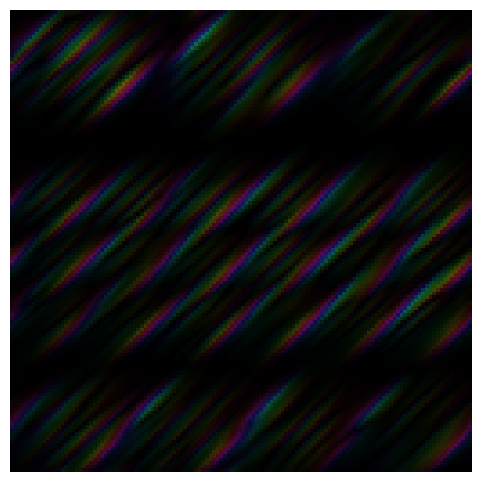

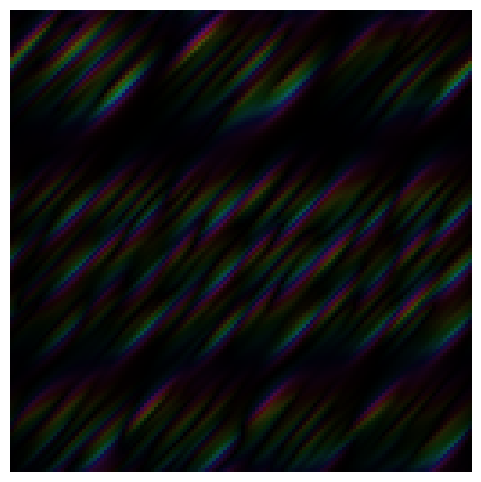

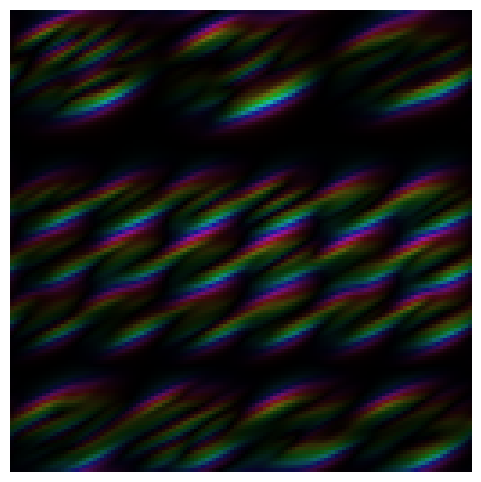

...

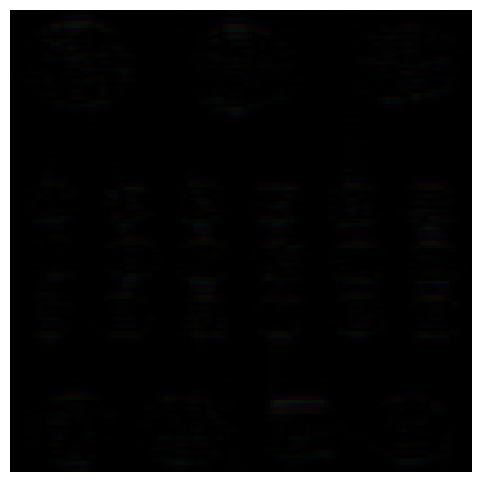

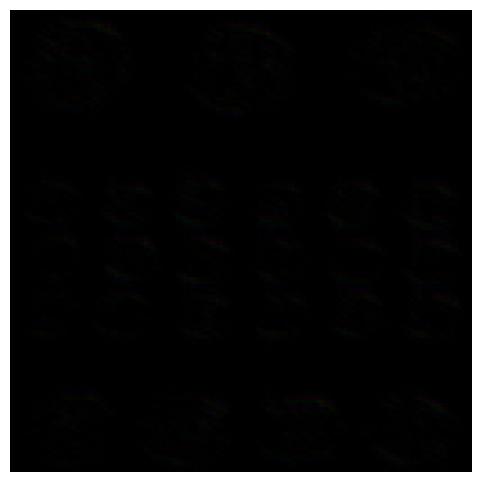

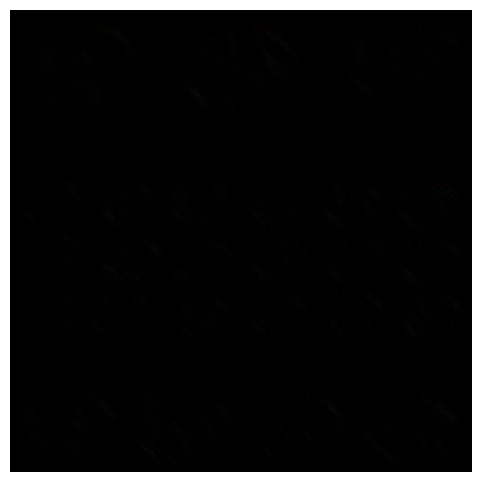

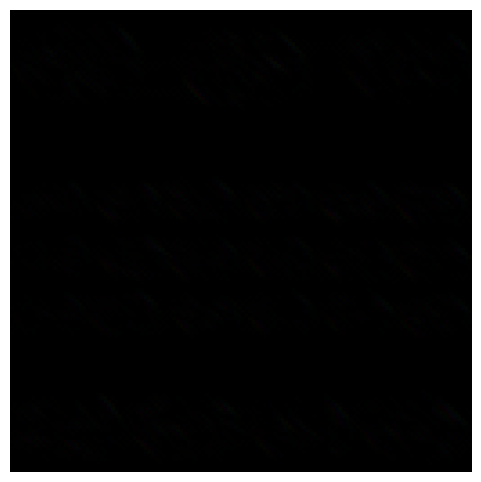

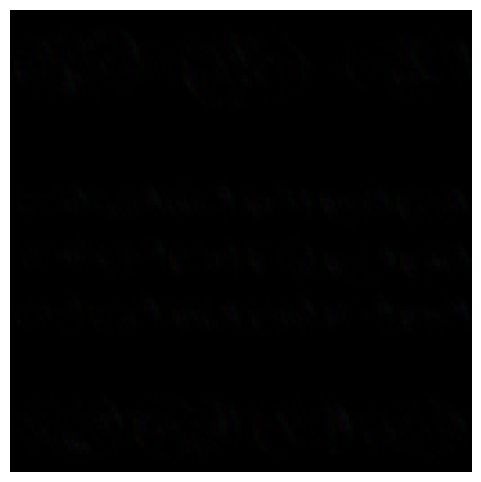

In [150]:
size = 128
img = np.array(Image.open("coins.png").convert('L'))
print(type(img))
image = resize(img, (size,size))

plt.figure(figsize = (6,6))
plt.axis("off")
plt.imshow(image, cmap = "gray")
plt.show()

# Relevant parameters for our Shearlet system
rows, cols = image.shape
sh_spec = CoShREMConfig(rows = rows,
                        cols = cols,
                        scales_per_octave = 2,
                        shear_level = 3,
                        octaves = 4,
                        alpha = .5,
                        wavelet_eff_support = 12,
                        gaussian_eff_support = 4)

print(f"sh_spec: {sh_spec}")

# Generating the shearlet system with pyCoShRem
device = torchutils.onceInit(kCUDA=True)
coshxform = CoShXform(sh_spec)
coshxform.start(device)

shearlets, shearletIdxs, RMS, dualFrameWeights = coshxform.shearletSystem

use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0")
torch.backends.cudnn.enabled = True

# We need to do the same for the image
image_complex = np.concatenate((image[:,:,np.newaxis], np.zeros(image.shape)[:,:,np.newaxis]), 2)
torch_image = torch.tensor(image_complex).unsqueeze(0).to(device)

t = time.time()
torch_coeffs = torchsheardec2D(torch_image, coshxform.torch_shearlets)
print(f"Elapsed time torchsheardec2D(): {time.time()-t:3f}ms")


torch_coeffs = coshxform.xform((image, None))

coeffs = torch_coeffs.cpu().squeeze()
qUpper = np.percentile(np.absolute(coeffs), 100)
print(coeffs.shape)
for c in range(coeffs.shape[-1]):
    coeff = coeffs[..., c]
    visual.complexImageShow(coeff/qUpper)

<class 'numpy.ndarray'> 0 254


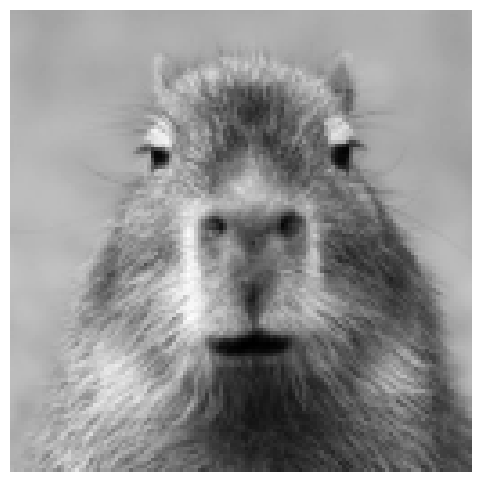

sh_spec: rows=128 cols=128 scales_per_octave=2 shear_level=3 octaves=5 alpha=0.5 wavelet_eff_support=256 gaussian_eff_support=128
torchutils.onceInit device = cuda:0
initSeeds(1)
0.01589692768434858
(128, 128, 100)


/tmp/ipykernel_1259218/1690460882.py:7: RuntimeWarning: divide by zero encountered in true_divide
  InversedualFrameWeights = 1 / dualFrameWeights


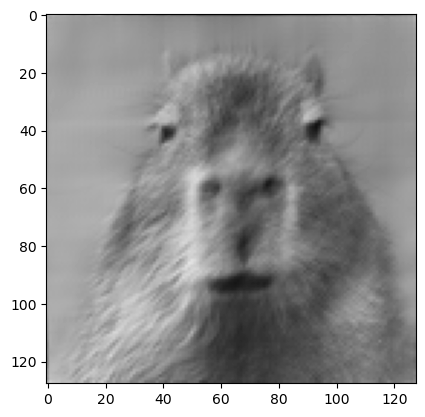

In [367]:
def shearrec2D(coeffs, shearlets, dualFrameWeights):
	"""Shearlet Reconstruction function."""
	print(coeffs.shape)
	Xfreq = np.zeros((coeffs.shape[-3], coeffs.shape[-2]), dtype=complex)
	for i in range(coeffs.shape[-1]):
		Xfreq += fftshift(fft2(ifftshift(coeffs[..., i])))* np.conj(shearlets[..., i])
	InversedualFrameWeights = 1 / dualFrameWeights
	InversedualFrameWeights[InversedualFrameWeights==np.inf] = 0.0
	return fftshift(ifft2(ifftshift(InversedualFrameWeights*Xfreq)))

def sheardec2D(X, shearlets):
	"""Shearlet Decomposition function."""
	# ## Classical way to compute the coefficients

	# Classically one compute the coefficients by using the convolution
	# 
	# $$
	# \text{SH}(f)_{j,k,m}^{2D} (f) = \overline{\psi^{d}_{j,k,m}}\ast f = \widehat{\psi^{d}_{j,k,m}}\cdot \widehat{f}
	# $$
	# 
	# where the last equality is obtained by using the Fourier convolutional theorem. Since Fourier is fast to compute the second identity is better to use.

	coeffs = np.zeros(shearlets.shape, dtype=complex)
	Xfreq = fftshift(fft2(ifftshift(X)))
	for i in range(shearlets.shape[-1]):
		coeffs[..., i] = fftshift(ifft2(ifftshift(Xfreq * np.conj(
								   shearlets[..., i]))))
	return coeffs

size = 128
img = np.array(Image.open("capybara.png").convert('L'))
print(type(img), img.min(), img.max())
image = resize(img, (size,size))

plt.figure(figsize = (6,6))
plt.axis("off")
plt.imshow(image, cmap = "gray")
plt.show()

# Relevant parameters for our Shearlet system
rows, cols = image.shape
sh_spec = CoShREMConfig(rows = rows,
                        cols = cols,
                        scales_per_octave = 2,
                        shear_level = 3,
                        octaves = 5,
                        alpha = 0.5,
                        wavelet_eff_support = 256,
                        gaussian_eff_support = 128)

print(f"sh_spec: {sh_spec}")

# Generating the shearlet system with pyCoShRem
device = torchutils.onceInit(kCUDA=True)
coshxform = CoShXform(sh_spec)
coshxform.start(device)

shearlets, shearletIdxs, RMS, dualFrameWeights = coshxform.shearletSystem

print(RMS)

coeffs = sheardec2D(image, shearlets)
recon = shearrec2D(coeffs, shearlets, dualFrameWeights)

# visual.complexImageShow(recon)
plt.imshow(recon.real, cmap='gray', vmin=0, vmax=1)
plt.show()

(128, 128, 100)


/tmp/ipykernel_1259218/711981358.py:7: RuntimeWarning: divide by zero encountered in true_divide
  InversedualFrameWeights = 1 / dualFrameWeights


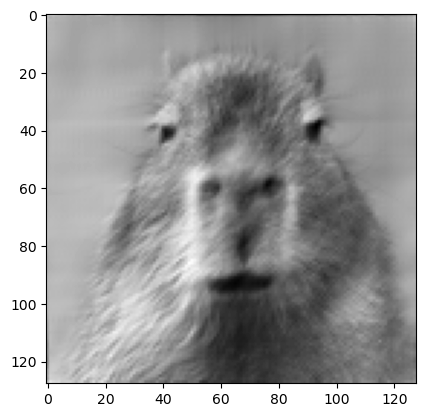

In [231]:
# it's clear that the maps at the finer scales are more and more sparse while those at the larger scale are denser.
# we can induce a degree of sparsity with minimal impact on the reconstruction.  
# I wonder if this sparsity is more pronounced on normalized images?  Not being offset from zero seems important.

from copy import deepcopy as copy
qLower = np.percentile(np.absolute(coeffs.real) * np.expand_dims(dualFrameWeights, -1), 25) # 25% sparsity
mask = np.absolute(coeffs.real) < qLower

masked_coeffs = copy(coeffs)
masked_coeffs[mask] = 0.0

recon = shearrec2D(masked_coeffs, shearlets, dualFrameWeights)
plt.imshow(recon.real, cmap='gray')
plt.show()

(128, 128, 100)


/tmp/ipykernel_1259218/711981358.py:7: RuntimeWarning: divide by zero encountered in true_divide
  InversedualFrameWeights = 1 / dualFrameWeights


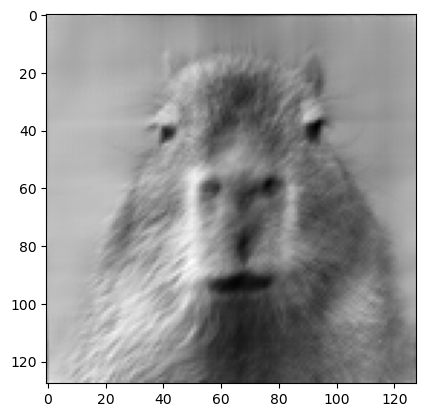

In [268]:
qLower = np.percentile(np.absolute(coeffs.real) * np.expand_dims(dualFrameWeights, -1), 25) # 25% sparsity
mask = np.absolute(coeffs.real) < qLower

masked_coeffs = copy(coeffs)
masked_coeffs[mask] = 0.0

masked_coeffs[..., 10:] = 0.0 # 92.5% sparsity

recon = shearrec2D(masked_coeffs, shearlets, dualFrameWeights)
plt.imshow(recon.real, cmap='gray')
plt.show()

(128, 128, 1)


/tmp/ipykernel_1259218/711981358.py:7: RuntimeWarning: divide by zero encountered in true_divide
  InversedualFrameWeights = 1 / dualFrameWeights


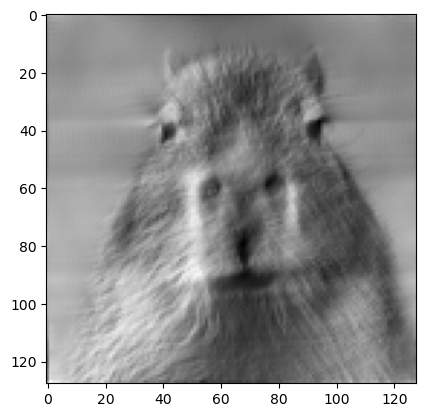

In [280]:
# the shearlet transformation is remarkable malleable in that it is happily compressed
# to less than a percent of its original size while maintaining much of the image quality
# even at this size we have not 
qLower = np.percentile(np.absolute(coeffs.real) * np.expand_dims(dualFrameWeights, -1), 40) # 40% sparsity
mask = np.absolute(coeffs.real) < qLower

masked_coeffs = copy(coeffs)
masked_coeffs[mask] = 0.0

recon = shearrec2D(masked_coeffs[..., :1], shearlets[..., :1], dualFrameWeights) # 99.40% sparsity
plt.imshow(recon.real.astype(np.float16), cmap='gray') # worth noting that this is still larger than the original image even considering sparsity
plt.show()

In [292]:
import torch
import torchvision
from torchvision.transforms import v2
from torchvision import transforms

normalize_transform = v2.Compose(
                    [
                        torchvision.transforms.ToTensor(),
                        transforms.Resize(size=(128, 128), antialias=True),
                        transforms.Normalize(
                                            mean=[0.485, 0.456, 0.406],
                                            std=[0.229, 0.224, 0.225]
                                            ),
                    ]
                    )

inverse_transform = v2.Compose(
                    [
                        transforms.Normalize(
                                            mean=[0, 0, 0],
                                            std=[1/0.229, 1/0.224, 1/0.225]
                                            ),
                        transforms.Normalize(
                                            mean=[-0.485, -0.456, -0.406],
                                            std=[1, 1, 1]
                                            ),
                    ]
                    )

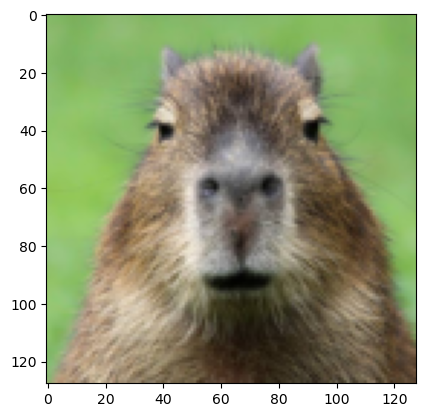

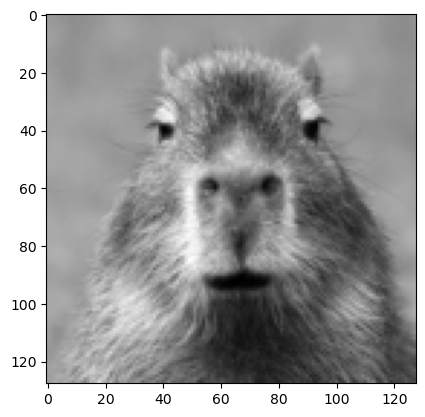

In [316]:
size = 128
pil_img = Image.open("capybara.png").convert('RGB')
normalized_img = normalize_transform(pil_img)
img = inverse_transform(normalized_img).permute(1, 2, 0)

plt.imshow(img)
plt.show()
plt.imshow(img.mean(-1), cmap='gray')
plt.show()

(128, 128, 10)


/tmp/ipykernel_1259218/711981358.py:7: RuntimeWarning: divide by zero encountered in true_divide
  InversedualFrameWeights = 1 / dualFrameWeights


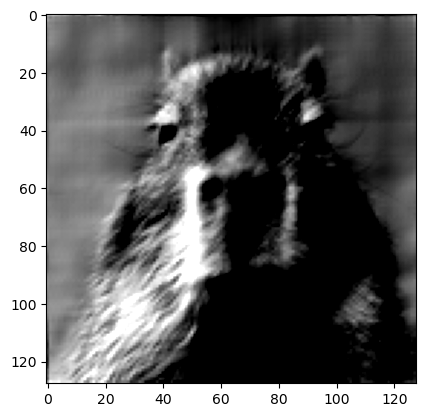

In [328]:
# the shearlet compression actually seems much less cooperative in the RGB case

coeffs = sheardec2D(normalized_img.mean(0), shearlets)

qLower = np.percentile(np.absolute(coeffs.real) * np.expand_dims(dualFrameWeights, -1), 10) # 10% sparsity
mask = np.absolute(coeffs.real) < qLower

masked_coeffs = copy(coeffs)
masked_coeffs[mask] = 0.0

recon = shearrec2D(masked_coeffs[..., :10], shearlets[..., :10], dualFrameWeights) # 91% sparsity
plt.imshow(recon.real.astype(np.float16), cmap='gray', vmin=0, vmax=1) # worth noting that this is still larger than the original image even considering sparsity
plt.show()

(128, 128, 10)
(128, 128, 10)
(128, 128, 10)


/tmp/ipykernel_1259218/1690460882.py:7: RuntimeWarning: divide by zero encountered in true_divide
  InversedualFrameWeights = 1 / dualFrameWeights


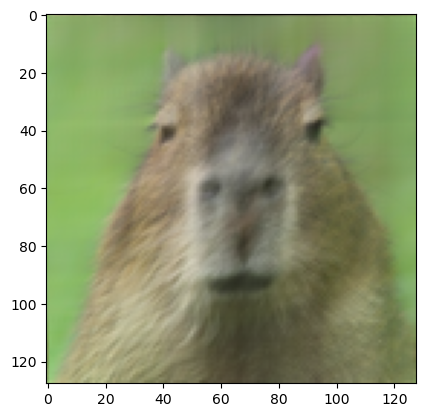

In [488]:
# the shearlet compression actually seems much less cooperative in the RGB case
recon = []
for i in range(normalized_img.shape[0]):
    coeffs = sheardec2D(normalized_img[i], shearlets)

    qLower = np.percentile(np.absolute(coeffs.real) * np.expand_dims(dualFrameWeights, -1), 10) # 10% sparsity
    mask = np.absolute(coeffs.real) < qLower

    masked_coeffs = copy(coeffs)
    masked_coeffs[mask] = 0.0

    recon.append(shearrec2D(masked_coeffs[..., :10], shearlets[..., :10], dualFrameWeights)) # 91% sparsity

recon_128p = inverse_transform(torch.tensor(np.stack(recon, 0)).real).permute(1, 2, 0)

plt.imshow(recon_128p, cmap='gray', vmin=0, vmax=1) # worth noting that this is still larger than the original image even considering sparsity
plt.show()

In [394]:
t = (torch.tensor(shearlets) * torch.tensor(dualFrameWeights).unsqueeze(-1)).sum(0).sum(0)

3
torch.Size([128, 128, 1]) (128, 128, 1)
(128, 128, 1)
torch.Size([128, 128, 1]) (128, 128, 1)
(128, 128, 1)
torch.Size([128, 128, 1]) (128, 128, 1)
(128, 128, 1)


/tmp/ipykernel_1259218/1690460882.py:7: RuntimeWarning: divide by zero encountered in true_divide
  InversedualFrameWeights = 1 / dualFrameWeights


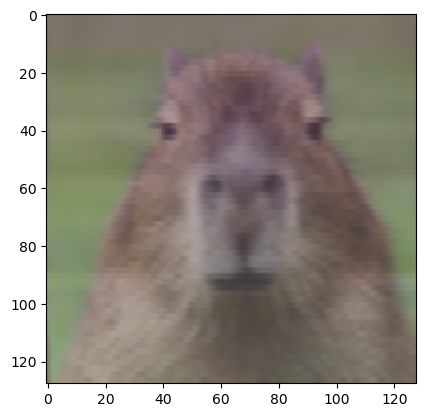

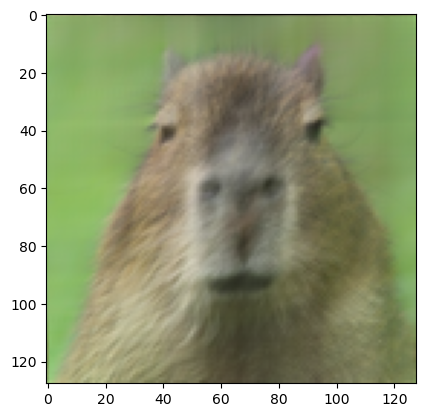

In [490]:
# sampling like this removes both spatial resolution and contrast
# downsample
downsample = torch.nn.AvgPool2d(2)
# upsample
upsample = lambda x: torch.nn.functional.interpolate(x, scale_factor=2, mode='nearest')

recon = []
bands = 1 # 99% sparsity

minimum = normalized_img.min()
maximum = normalized_img.max()

print(normalized_img.shape[0])
for i in range(normalized_img.shape[0]):
    coeffs = sheardec2D(normalized_img[i], shearlets)
    coeffs = coeffs[..., :bands]
    qLower = np.percentile(np.absolute(coeffs.real) * np.expand_dims(dualFrameWeights, -1), 00) # 99.5% sparsity
    mask = np.absolute(coeffs.real) < qLower

    coeffs[mask] = 0.0

    masked_coeffs = torch.zeros_like(torch.tensor(coeffs))
    masked_coeffs.real = upsample(downsample(torch.tensor(coeffs.real).permute(2, 0, 1).unsqueeze(0))).squeeze(0).permute(1, 2, 0)
    masked_coeffs.imag = upsample(downsample(torch.tensor(coeffs.imag).permute(2, 0, 1).unsqueeze(0))).squeeze(0).permute(1, 2, 0)
    # correcting the frame weights this way allows better sparsity
    print(masked_coeffs.shape, shearlets[..., :bands].shape)
    recon.append(shearrec2D(np.array(masked_coeffs), np.array(shearlets[..., :bands]), np.sum(np.power(np.abs(shearlets[..., :bands]), 2), axis=2))) # 91% sparsity

recon_downsampled_wavelets = inverse_transform(torch.tensor(np.stack(recon, 0)).real).permute(1, 2, 0)

plt.imshow(recon_downsampled_wavelets, vmin=0, vmax=1) # worth noting that this is still larger than the original image even considering sparsity
plt.show()
display()
plt.imshow(recon_128p, cmap='gray', vmin=0, vmax=1) # worth noting that this is still larger than the original image even considering sparsity
plt.show()

In [471]:
print(shearlets.shape)

(128, 128, 100)


3
(64, 64, 100)
(64, 64, 100)
(64, 64, 100)


/tmp/ipykernel_1259218/1690460882.py:7: RuntimeWarning: divide by zero encountered in true_divide
  InversedualFrameWeights = 1 / dualFrameWeights


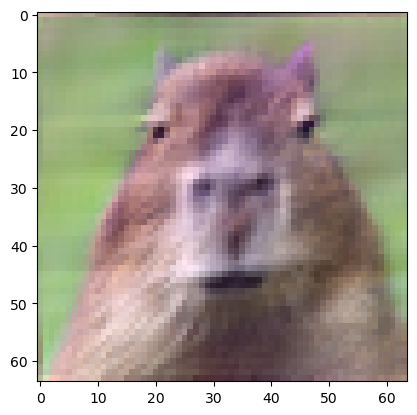

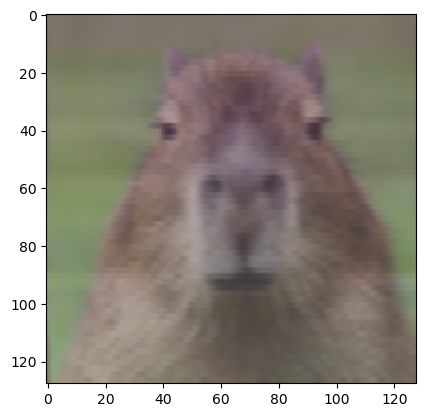

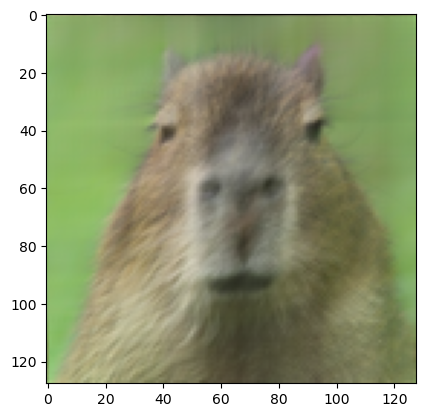

In [497]:
# downsample
downsample = torch.nn.AvgPool2d(2)
# upsample
upsample = lambda x: torch.nn.functional.interpolate(x, scale_factor=2, mode='nearest')

recon = []
c = []
print(normalized_img.shape[0])
for i in range(normalized_img.shape[0]):
    coeffs = sheardec2D(normalized_img[i], shearlets)
    c.append(coeffs)

    qLower = np.percentile(np.absolute(coeffs.real) * np.expand_dims(dualFrameWeights, -1), 00) # 10% sparsity
    mask = np.absolute(coeffs.real) < qLower

    masked_coeffs = copy(coeffs)
    masked_coeffs[mask] = 0.0

    masked_coeffs = torch.zeros_like(torch.tensor(masked_coeffs))[:64, :64]
    masked_coeffs.real = downsample(torch.tensor(coeffs.real).permute(2, 0, 1)).permute(1, 2, 0)
    masked_coeffs.imag = downsample(torch.tensor(coeffs.imag).permute(2, 0, 1)).permute(1, 2, 0)
    masked_shearlets = torch.zeros_like(torch.tensor(shearlets))[:64, :64]
    masked_shearlets.real = downsample(torch.tensor(shearlets.real).permute(2, 0, 1)).permute(1, 2, 0)
    masked_shearlets.imag = downsample(torch.tensor(shearlets.imag).permute(2, 0, 1)).permute(1, 2, 0)
    masked_dualFrameWeights = downsample(torch.tensor(dualFrameWeights).unsqueeze(0)).squeeze()

    recon.append(shearrec2D(np.array(masked_coeffs[..., :]), np.array(masked_shearlets[..., :]), np.sum(np.power(np.abs(masked_shearlets[..., :].numpy()), 2), axis=2) / 4)) # 91% sparsity

recon_downsampled = inverse_transform(torch.tensor(np.stack(recon, 0)).real).permute(1, 2, 0)

plt.imshow(recon_downsampled / recon_downsampled.max(), vmin=0, vmax=1) # worth noting that this is still larger than the original image even considering sparsity
plt.show()
display()
plt.imshow(recon_downsampled_wavelets, vmin=0, vmax=1) # worth noting that this is still larger than the original image even considering sparsity
plt.show()
display()
plt.imshow(recon_128p, cmap='gray', vmin=0, vmax=1) # worth noting that this is still larger than the original image even considering sparsity
plt.show()

3
real zeros: tensor(1) mask zeros: 2346
(128, 128, 1)
real zeros: tensor(1) mask zeros: 2364
(128, 128, 1)
real zeros: tensor(1) mask zeros: 2335
(128, 128, 1)
tensor(6.1035e-05)


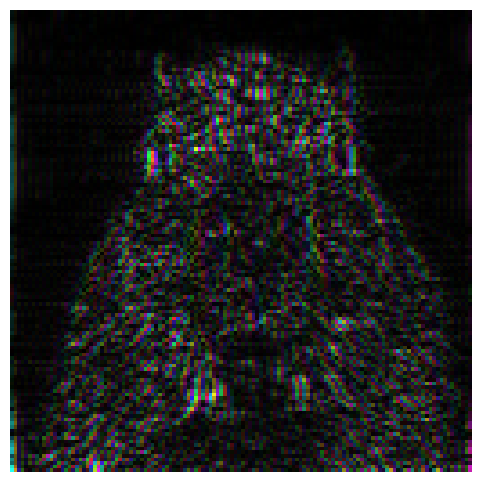

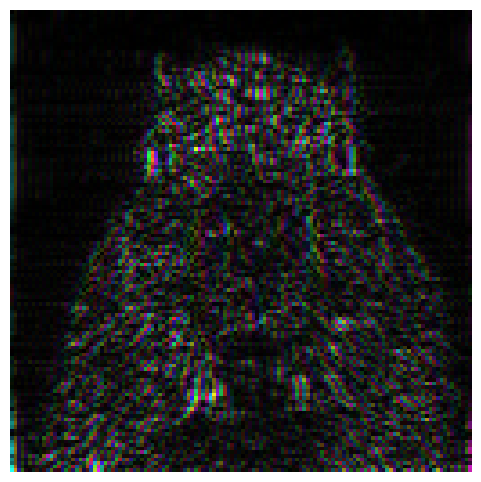

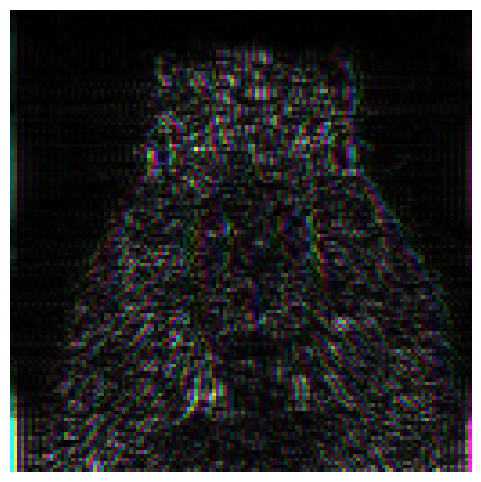

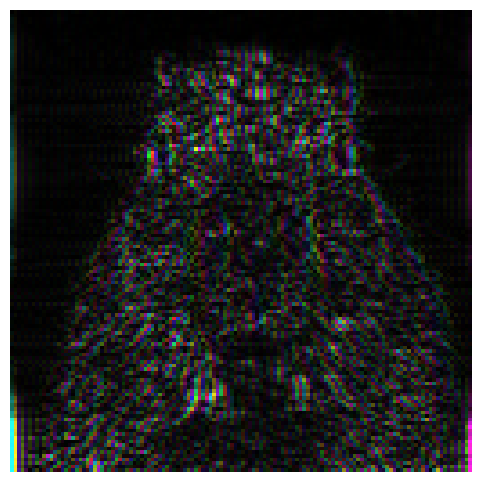

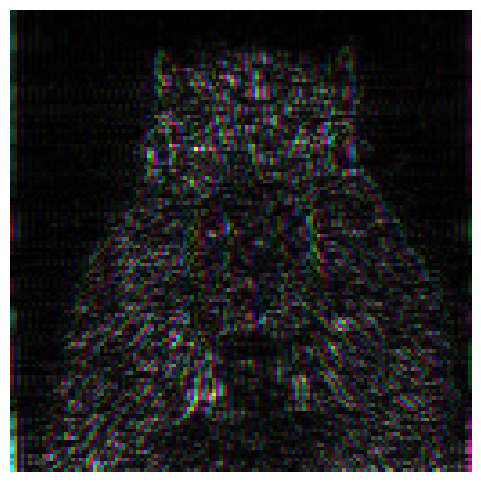

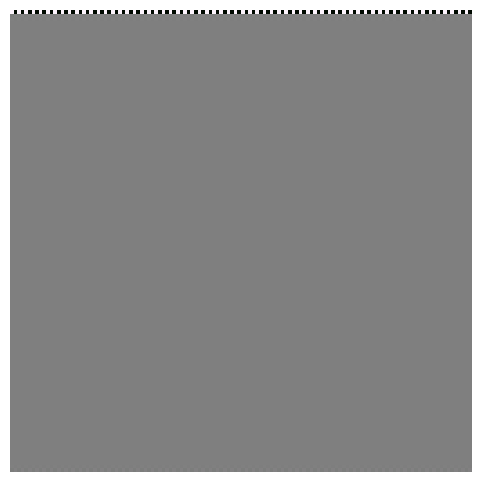

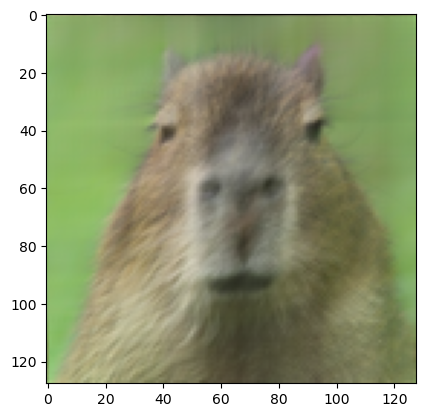

In [621]:
# sampling like this removes both spatial resolution and contrast
# downsample
downsample = torch.nn.AvgPool2d(2)
# upsample
upsample = lambda x: torch.nn.functional.interpolate(x, scale_factor=2, mode='nearest')

def is_peak(coeffs):
    up = np.roll(coeffs, 1, -2)
    down = np.roll(coeffs, -1, -2)
    right = np.roll(coeffs, 1, -3) < coeffs
    left = np.roll(coeffs, -1, -3) < coeffs

    up_right = np.roll(coeffs, 1, -3) < coeffs
    up_left = np.roll(coeffs, -1, -3) < coeffs
    down_right = np.roll(down, 1, -3) < coeffs
    down_left = np.roll(down, -1, -3) < coeffs

    up = up < coeffs
    down = down < coeffs

    return up * down * right * left * up_right * up_left * down_right * down_left

def peaks_compression(normalized_img):
    recon = []
    coeffs_arr = []
    bands = 1 # 99% sparsity

    print(normalized_img.shape[0])
    for i in range(normalized_img.shape[0]):
        coeffs = sheardec2D(normalized_img[i], shearlets)

        coeffs = torch.tensor(coeffs[..., :bands])
        dualFrameWeights = torch.tensor(np.sum(np.power(np.abs(shearlets[..., :bands]), 2), axis=2))

        importance = np.absolute(coeffs).real

        qLower = np.percentile(importance, 30) # 10% sparsity
        mask = importance < qLower

        visual.complexImageShow(coeffs / coeffs.real.max())

        mask = is_peak(coeffs.numpy())
        # coeffs[~mask] = 0
        coeffs.real[0, 0, 0] = 0

        visual.complexImageShow(coeffs / coeffs.real.max())

        print('real zeros:', (coeffs.real == 0).sum(), 'mask zeros:', mask.sum())

        coeffs_arr.append(copy(coeffs))

        recon.append(shearrec2D(np.array(coeffs), np.array(shearlets[..., :bands]), dualFrameWeights))

    sparsity = (torch.tensor(np.stack(coeffs_arr, 0)) == 0).sum() / torch.tensor(np.stack(coeffs_arr, 0)).flatten().shape[0]

    print(sparsity)

    return inverse_transform(torch.tensor(np.stack(recon, 0)).real).permute(1, 2, 0)

ima = peaks_compression(normalized_img)
ima -= ima.min()
ima /= ima.max()
plt.imshow(ima / ima.max(), vmin=0, vmax=1) # worth noting that this is still larger than the original image even considering sparsity
plt.show()
plt.imshow(recon_128p, cmap='gray', vmin=0, vmax=1) # worth noting that this is still larger than the original image even considering sparsity
plt.show()